<a href="https://colab.research.google.com/github/Keray18/Dog-_Breed_Identification/blob/main/Dog_Breed_Identification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multi-class 🐶Dog Breed Classification 

This notebook builds an end-to-end multi-class image 
classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2. Data

The data used here is from Kaggle's dog breed 
identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probablity for
each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:

* Dealing with images (Unstructured data) so it's best to
use Deep Learning/Transfer Learning.
* There are 120 breeds of dog (Means 120 different classes).
* There are 10,222 images in the Training set 
(these images have labels).
* There are 10,222 images in Testing set 
(these images do not have labels). 


In [ ]:
# Unzip the data into google drive.
!unzip "drive/MyDrive/Dog_Breed/dog-breed-identification.zip" -d "drive/MyDrive/Dog_Breed/"

In [143]:
# importing TensorFlow 2.0 and TensorFlow Hub.
import tensorflow as tf
import tensorflow_hub as hub

print("TensorFlow Version: ", tf.__version__)
print("TensorFlow Hub Version: ", hub.__version__)

# Checking the availability of the GPU
print("GPU", "available (YESSSSS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TensorFlow Version:  2.9.2
TensorFlow Hub Version:  0.12.0
GPU available (YESSSSS!!!!)


# Getting our data ready (turning into tensors)

Data needs to be in neumerical format,so images will be turned into 
tensors (neumerical representation).

In [3]:
# Checking the Labels of the data.
import pandas as pd
labels = pd.read_csv("drive/MyDrive/Dog_Breed/labels.csv")
print(labels.describe())
print(labels.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
labels.head(20)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
5,002211c81b498ef88e1b40b9abf84e1d,bedlington_terrier
6,00290d3e1fdd27226ba27a8ce248ce85,bedlington_terrier
7,002a283a315af96eaea0e28e7163b21b,borzoi
8,003df8b8a8b05244b1d920bb6cf451f9,basenji
9,0042188c895a2f14ef64a918ed9c7b64,scottish_deerhound


In [5]:
# Checking how many images are there of each breed.
labels['breed'].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

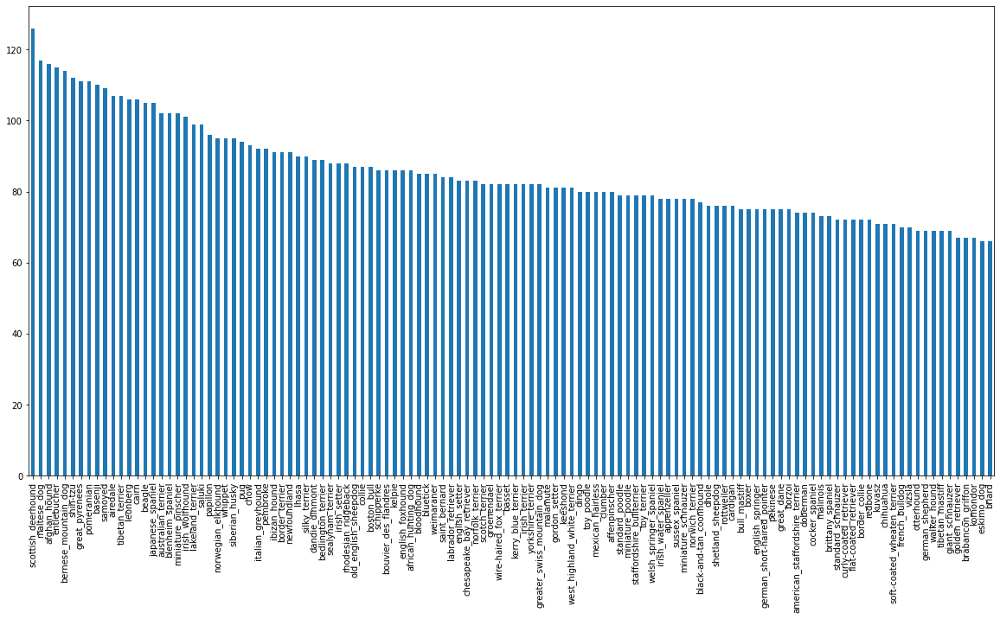

In [6]:
labels['breed'].value_counts().plot.bar(figsize=(20, 10));

In [7]:
# Median number of images per class
labels['breed'].value_counts().median()

82.0

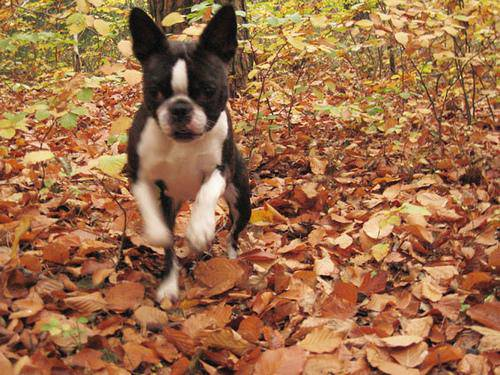

In [8]:
# Viewing an Image.
from IPython.display import Image
Image("drive/MyDrive/Dog_Breed/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting Images and their labels

Getting a list of all Images file pathnames.

In [9]:
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [10]:
# Creating pathnames from Img Id's.
filenames = ["drive/MyDrive/Dog_Breed/train/"+i+".jpg" for i in labels['id']]
filenames[:10]

['drive/MyDrive/Dog_Breed/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog_Breed/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog_Breed/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog_Breed/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog_Breed/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog_Breed/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog_Breed/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog_Breed/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog_Breed/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog_Breed/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

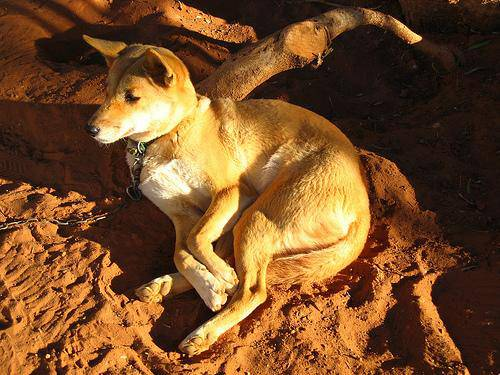

In [11]:
Image(filenames[1])

In [12]:
# Checking that the number of actual Images match the filenames
import os
if len(os.listdir("drive/MyDrive/Dog_Breed/train")) == len(filenames):
  print("Filenames matches the actual Images! Proceed.") 
else:
  print("False!!! Check the target directory.")

Filenames matches the actual Images! Proceed.


In [13]:
labels.head(), filenames[:5]

(                                 id             breed
 0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
 1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
 2  001cdf01b096e06d78e9e5112d419397          pekinese
 3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
 4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever,
 ['drive/MyDrive/Dog_Breed/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
  'drive/MyDrive/Dog_Breed/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
  'drive/MyDrive/Dog_Breed/train/001cdf01b096e06d78e9e5112d419397.jpg',
  'drive/MyDrive/Dog_Breed/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
  'drive/MyDrive/Dog_Breed/train/0021f9ceb3235effd7fcde7f7538ed62.jpg'])

### Turning data labels into tensors

In [14]:
import numpy as np
breeds = labels['breed'].to_numpy()
breeds

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
filenames[:10]

['drive/MyDrive/Dog_Breed/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog_Breed/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog_Breed/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog_Breed/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog_Breed/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog_Breed/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog_Breed/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog_Breed/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog_Breed/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog_Breed/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [16]:
len(breeds), len(filenames)

(10222, 10222)

In [17]:
unique_breeds = np.unique(breeds)
print(unique_breeds)
print("")
print("Total Number Of Unique Breeds: ", len(unique_breeds))

['affenpinscher' 'afghan_hound' 'african_hunting_dog' 'airedale'
 'american_staffordshire_terrier' 'appenzeller' 'australian_terrier'
 'basenji' 'basset' 'beagle' 'bedlington_terrier' 'bernese_mountain_dog'
 'black-and-tan_coonhound' 'blenheim_spaniel' 'bloodhound' 'bluetick'
 'border_collie' 'border_terrier' 'borzoi' 'boston_bull'
 'bouvier_des_flandres' 'boxer' 'brabancon_griffon' 'briard'
 'brittany_spaniel' 'bull_mastiff' 'cairn' 'cardigan'
 'chesapeake_bay_retriever' 'chihuahua' 'chow' 'clumber' 'cocker_spaniel'
 'collie' 'curly-coated_retriever' 'dandie_dinmont' 'dhole' 'dingo'
 'doberman' 'english_foxhound' 'english_setter' 'english_springer'
 'entlebucher' 'eskimo_dog' 'flat-coated_retriever' 'french_bulldog'
 'german_shepherd' 'german_short-haired_pointer' 'giant_schnauzer'
 'golden_retriever' 'gordon_setter' 'great_dane' 'great_pyrenees'
 'greater_swiss_mountain_dog' 'groenendael' 'ibizan_hound' 'irish_setter'
 'irish_terrier' 'irish_water_spaniel' 'irish_wolfhound'
 'italian

In [18]:
# Turn labels into array of booleans
bool_labels = [i == unique_breeds for i in breeds]
bool_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [19]:
len(bool_labels)

10222

In [20]:
print(breeds[0]) # Original label
print(np.where(unique_breeds == breeds[0])) # Index where label is
print(bool_labels[0].argmax()) # Index where label is in boolean array 

# Creting a function to convert boolean labels into integers
def convert_label(bool_val):
  print(bool_val.astype(int)) # Convert boolean to integer

convert_label(bool_labels[0])

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating a Validation Set

Since the dataset from Kaggle does not provide a validation set, so
it is necessary to create our own set.

In [21]:
# Setup X and Y variables
x = filenames
y = bool_labels

len(x), len(y)

(10222, 10222)

Going to start experiment with ~1000 images and increase as needed

In [22]:
# Setting number of images to be used for experiment.
NUM_IMG = 1000 #@param {type: 'slider', min: 1000, max: 10000, step: 1000}

In [23]:
# Splitting data into train and validation sets.
from sklearn.model_selection import train_test_split

x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMG], 
                                                  y[:NUM_IMG], 
                                                  test_size = 0.2, 
                                                  random_state = 42)

len(x_train), len(x_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [24]:
x_train[:5], y_train[:5]

(['drive/MyDrive/Dog_Breed/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog_Breed/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog_Breed/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog_Breed/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog_Breed/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False

## Preprocessing images (Turning Images into tensors)

To Preprocess the images into tensors, a function is created 
which performs the followig functions:

1. Take an `image` filepath as input.
2. Use tensorflow to read an file and save it to a variable, `image`.
3. Turn an `image`(jpg) into tensors.
4. Normalize the `image`.
5. Resize the image of the shape(224,224)

In [25]:
IMG_SIZE = 224

def process_img(file_path, img_size=IMG_SIZE):
  image = tf.io.read_file(file_path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

process_img(x[1])

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.22176053, 0.1532646 , 0.12077089],
        [0.24290617, 0.17007563, 0.12532842],
        [0.25025794, 0.16272292, 0.10750583],
        ...,
        [0.4866906 , 0.31810695, 0.18481737],
        [0.46775866, 0.32910115, 0.20204483],
        [0.36027768, 0.2283099 , 0.11981372]],

       [[0.22331059, 0.14479166, 0.10454448],
        [0.20956516, 0.13433544, 0.08120592],
        [0.20576334, 0.11818807, 0.06297097],
        ...,
        [0.34747207, 0.21052358, 0.10098224],
        [0.25428382, 0.14531395, 0.05989731],
        [0.22268865, 0.11715643, 0.03506609]],

       [[0.21673436, 0.12777252, 0.0741048 ],
        [0.20701681, 0.11805496, 0.05878148],
        [0.22288738, 0.12433177, 0.0666433 ],
        ...,
        [0.19956292, 0.10319562, 0.05528758],
        [0.24323113, 0.17113218, 0.12510629],
        [0.17322922, 0.11525137, 0.08183777]],

       ...,

       [[0.71888185, 0.40606675, 0.10109472],
        [0.72

## Turning our data into batches

In [26]:
 # Creating a function to return tuple (image,label)
def get_img_label(image_path, label):
  image = process_img(image_path)
  return image, label

get_img_label(x[1],y[1])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.22176053, 0.1532646 , 0.12077089],
         [0.24290617, 0.17007563, 0.12532842],
         [0.25025794, 0.16272292, 0.10750583],
         ...,
         [0.4866906 , 0.31810695, 0.18481737],
         [0.46775866, 0.32910115, 0.20204483],
         [0.36027768, 0.2283099 , 0.11981372]],
 
        [[0.22331059, 0.14479166, 0.10454448],
         [0.20956516, 0.13433544, 0.08120592],
         [0.20576334, 0.11818807, 0.06297097],
         ...,
         [0.34747207, 0.21052358, 0.10098224],
         [0.25428382, 0.14531395, 0.05989731],
         [0.22268865, 0.11715643, 0.03506609]],
 
        [[0.21673436, 0.12777252, 0.0741048 ],
         [0.20701681, 0.11805496, 0.05878148],
         [0.22288738, 0.12433177, 0.0666433 ],
         ...,
         [0.19956292, 0.10319562, 0.05528758],
         [0.24323113, 0.17113218, 0.12510629],
         [0.17322922, 0.11525137, 0.08183777]],
 
        ...,
 
        [[0.71888185, 0.40606675

In [27]:
# Function to turn data into batches.
BATCH_SIZE = 32

def create_batch(x, y=None, test_data=False, val_data=False, batch_size=BATCH_SIZE):

  if test_data:
    print("Creating test_data batches.......")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch = data.map(process_img).batch(BATCH_SIZE)
    return data_batch

  elif val_data:
    print("Creating val_data batches........")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))
    data_batch = data.map(get_img_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating train_data batches........")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))
    data = data.shuffle(buffer_size=len(x))
    data = data.map(get_img_label)
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [28]:
train_data = create_batch(x_train, y_train)
val_data = create_batch(x_val, y_val, val_data=True)

Creating train_data batches........
Creating val_data batches........


In [29]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [30]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [31]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

In [32]:
# Getting Training data from training batch.
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[7.96805084e-01, 7.41903067e-01, 7.41903067e-01],
          [8.23660791e-01, 7.68758833e-01, 7.68758833e-01],
          [8.24159741e-01, 7.69257784e-01, 7.69257784e-01],
          ...,
          [7.97252715e-01, 7.42350698e-01, 7.41405368e-01],
          [8.17051888e-01, 7.59550154e-01, 7.67349541e-01],
          [8.17051888e-01, 7.58735836e-01, 7.68978119e-01]],
 
         [[7.95351982e-01, 7.40449965e-01, 7.36528397e-01],
          [8.18918526e-01, 7.64016569e-01, 7.60095000e-01],
          [8.15822899e-01, 7.60920942e-01, 7.56999373e-01],
          ...,
          [8.10504317e-01, 7.55602360e-01, 7.54616797e-01],
          [8.31285059e-01, 7.76383102e-01, 7.75737464e-01],
          [8.31285059e-01, 7.76383102e-01, 7.74816871e-01]],
 
         [[7.85374165e-01, 7.30472147e-01, 7.26550579e-01],
          [8.13669562e-01, 7.58767605e-01, 7.54846036e-01],
          [7.99568176e-01, 7.44666159e-01, 7.40744591e-01],
          ...,
          [8.05345595e-01, 7.50443637e-01, 7.4589

In [33]:
# Getting Validation data from validation batch.
val_images, val_labels = next(val_data.as_numpy_iterator())
val_images, val_labels

(array([[[[0.29599646, 0.43284872, 0.3056691 ],
          [0.26635826, 0.32996926, 0.22846507],
          [0.31428418, 0.27701408, 0.22934894],
          ...,
          [0.77614343, 0.82320225, 0.8101595 ],
          [0.81291157, 0.8285351 , 0.8406944 ],
          [0.8209297 , 0.8263737 , 0.8423668 ]],
 
         [[0.2344871 , 0.31603682, 0.19543913],
          [0.3414841 , 0.36560842, 0.27241898],
          [0.45016077, 0.40117094, 0.33964607],
          ...,
          [0.7663987 , 0.8134138 , 0.81350833],
          [0.7304248 , 0.75012016, 0.76590735],
          [0.74518913, 0.76002574, 0.7830809 ]],
 
         [[0.30157745, 0.3082587 , 0.21018331],
          [0.2905954 , 0.27066195, 0.18401104],
          [0.4138316 , 0.36170745, 0.2964005 ],
          ...,
          [0.79871625, 0.8418535 , 0.8606443 ],
          [0.7957738 , 0.82859945, 0.8605655 ],
          [0.75181633, 0.77904975, 0.8155256 ]],
 
         ...,
 
         [[0.9746779 , 0.9878955 , 0.9342279 ],
          [0.99153

In [34]:
import matplotlib.pyplot as plt

# Creating a function to view 25 images.
def show_img(image, label):
  
  plt.figure(figsize=(15, 15))
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(image[i])
    plt.title(unique_breeds[label[i].argmax()])
    plt.axis("off")

### Visualizing Training batch

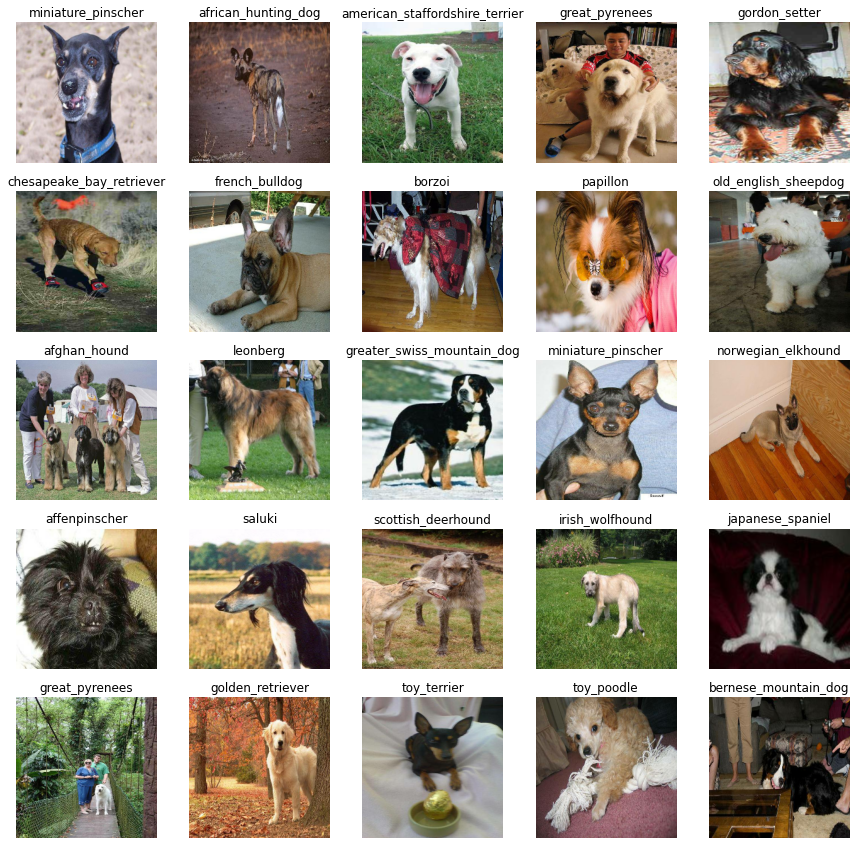

In [35]:
show_img(train_images, train_labels)

### Visualizing Validation batch

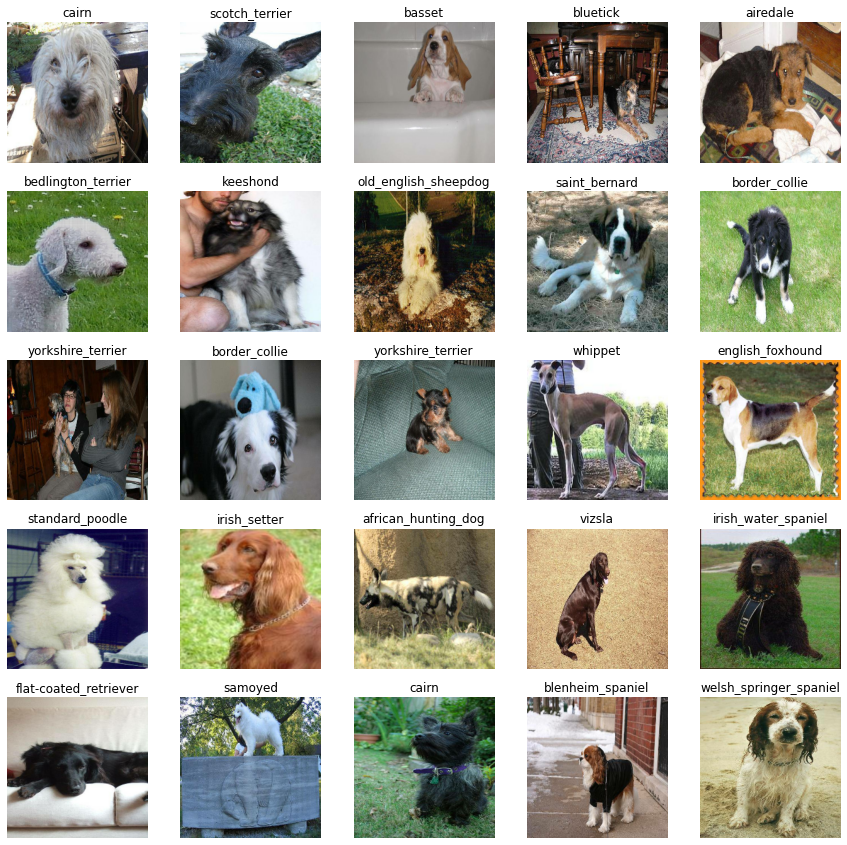

In [36]:
show_img(val_images, val_labels)

## Building a Model


In [37]:
# Setting input shape of the model.
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# Setting output shape of the model.
OUTPUT_SHAPE = len(unique_breeds)

# Setting model URL from TensorFlow Hub.
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5" 

### Creating a function which:

* Defines the layers in a Keras model in a sequential way.

* Compiles the model.

* Builds the model.

In [38]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building the model with: ", MODEL_URL)

  model = tf.keras.Sequential([hub.KerasLayer(MODEL_URL),
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                     activation="softmax")])
  
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])
  
  model.build(INPUT_SHAPE)

  return model

In [39]:
model = create_model()
model.summary()

Building the model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


### Creating Callbacks

Creating two callbacks:

1. For TensorBoard (helps to track the model's progress).

2. For early stopping (helps to prevent overfitting).

In [40]:
import datetime

# Creating a function for tensorboard callback
def tensorboard_callback():
  logdir = os.path.join("drive/MyDrive/Dog_Breed/Logs", 
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


# Creating early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", 
                                                  patience=3)

## Training a model

In [41]:
# Setting Epochs
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [42]:
# Creating a function to train model
def train_model():

  # Creating model
  model = create_model()

  # Creating a new tensorboard session everytime a new model is created
  tensorboard = tensorboard_callback()

  # Fitting the model
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  return model

In [43]:
model = train_model()

Building the model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 275s 11s/step - loss: 4.6366 - accuracy: 0.0950 - val_loss: 3.4346 - val_accuracy: 0.2600
Epoch 2/100
25/25 [==============================] - 33s 1s/step - loss: 1.6654 - accuracy: 0.6700 - val_loss: 2.1456 - val_accuracy: 0.5050
Epoch 3/100
25/25 [==============================] - 32s 1s/step - loss: 0.5700 - accuracy: 0.9362 - val_loss: 1.6560 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 32s 1s/step - loss: 0.2546 - accuracy: 0.9900 - val_loss: 1.4647 - val_accuracy: 0.6200
Epoch 5/100
25/25 [==============================] - 39s 2s/step - loss: 0.1462 - accuracy: 0.9987 - val_loss: 1.4013 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 39s 2s/step - loss: 0.1001 - accuracy: 1.0000 - val_loss: 1.3634 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================] - 3

In [44]:
%load_ext tensorboard
%tensorboard --logdir drive/MyDrive/Dog_Breed/Logs

<IPython.core.display.Javascript object>

## Making and Evaluating predictions

In [45]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 8s 938ms/step


array([[1.69613719e-04, 4.79336813e-05, 2.51490565e-04, ...,
        6.76435593e-04, 7.24279971e-06, 6.05840585e-04],
       [5.99752180e-03, 1.26090890e-04, 3.22889164e-03, ...,
        5.75576487e-05, 1.66521198e-03, 4.80025046e-05],
       [7.99597217e-07, 1.09975044e-04, 1.93534488e-05, ...,
        5.46285901e-06, 3.11353251e-05, 1.10006717e-04],
       ...,
       [1.10516726e-06, 4.78528091e-05, 3.78772602e-05, ...,
        6.18022705e-06, 3.06731781e-05, 3.09764328e-05],
       [2.68930627e-04, 4.31686021e-05, 1.73065528e-05, ...,
        1.07236692e-05, 9.05632260e-06, 1.46167574e-03],
       [9.39996855e-04, 1.84416222e-05, 8.62640154e-04, ...,
        8.49252008e-03, 6.53025275e-03, 5.12442675e-05]], dtype=float32)

In [46]:
predictions.shape

(200, 120)

In [47]:
len(y_val)

200

In [48]:
len(unique_breeds)

120

In [49]:
predictions[0]

array([1.69613719e-04, 4.79336813e-05, 2.51490565e-04, 2.66786628e-06,
       1.93778120e-04, 6.40484650e-05, 9.28479619e-03, 2.68943608e-04,
       5.62477871e-05, 3.04616289e-04, 1.96195673e-04, 3.00559506e-04,
       7.75346824e-04, 3.90898822e-05, 6.90947694e-04, 4.91808925e-04,
       5.51242783e-06, 3.66797596e-01, 1.00217503e-05, 1.48224062e-05,
       1.22764061e-04, 9.31792965e-05, 5.19452215e-06, 9.43849504e-04,
       4.23598976e-05, 1.47493280e-04, 1.51012316e-01, 9.12626056e-05,
       4.47983766e-04, 5.54419603e-05, 1.46185426e-04, 7.38877570e-04,
       2.61849578e-04, 9.92352489e-06, 1.95865345e-04, 8.14118888e-03,
       3.31419833e-05, 5.26465068e-04, 6.81057645e-06, 2.45025658e-05,
       2.08729645e-03, 4.23025131e-06, 1.02065889e-04, 1.21580182e-04,
       3.34801480e-05, 2.09485152e-04, 8.07909510e-06, 2.82793062e-05,
       3.28206224e-05, 9.93763169e-05, 3.69200534e-05, 1.73232165e-05,
       3.11125070e-04, 1.04001119e-05, 4.70813902e-05, 5.24847064e-06,
      

In [50]:
# First prediction 
index = 75
print(predictions[index])
print("")
print(f"Max Value (Probablity Prediction): {np.max(predictions[index])}")
print(f"Sum: {np.max(predictions[index])}")
print(f"Max Index: {np.argmax(predictions[index])}")
print(f"Predicted Label: {unique_breeds[np.argmax(predictions[index])]}")

[1.5351739e-06 6.7505280e-06 1.0833588e-06 9.7941577e-01 3.5239782e-06
 1.0303918e-06 2.0962098e-06 8.8662619e-06 3.0783888e-06 8.5645820e-07
 4.5896868e-06 6.7198802e-05 4.4654898e-05 1.5856906e-06 5.7278125e-05
 1.3484045e-04 1.7379018e-06 3.0990702e-04 7.4793570e-07 1.0513334e-07
 6.4574677e-05 1.2555729e-06 6.0263790e-07 3.4014524e-06 1.9295376e-06
 2.8033407e-06 1.8062421e-05 2.9594385e-06 4.4335160e-05 1.3307805e-07
 7.3966203e-07 3.1759469e-06 1.1262066e-06 1.1482854e-06 1.5006068e-05
 1.1662903e-06 1.2906513e-05 1.5382089e-06 7.8847725e-06 3.6067577e-05
 2.6838700e-07 6.1448577e-07 3.0264951e-06 8.9228661e-06 1.1371354e-07
 1.9237280e-06 3.9475664e-05 2.0968957e-06 1.6474718e-05 1.4175930e-06
 5.7996702e-05 1.2252799e-06 1.2505432e-06 2.3550820e-06 1.9003080e-06
 8.4099332e-07 8.4481935e-06 8.5678999e-05 2.2579105e-05 1.1312405e-03
 1.1520311e-06 1.4027969e-06 1.2910200e-06 1.5313983e-06 5.7787097e-06
 3.9654983e-06 5.2225264e-06 2.3484690e-05 1.6480124e-02 1.5044232e-06
 5.474

In [51]:
# Turning prediction probablity into their labels.
def get_preds_label(prediction_probablity):
  return unique_breeds[np.argmax(prediction_probablity)]

pred_label = get_preds_label(predictions[75])
pred_label

'airedale'

In [52]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [53]:
# Creating a function to unbatch a dataset
def unbatching(data):
  smp1 = []
  smp2 = []
  for i, j in data.unbatch().as_numpy_iterator():
    smp1.append(i)
    smp2.append(unique_breeds[np.argmax(j)])
  return smp1, smp2

# Unbatching validation data
val_images, val_labels = unbatching(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [54]:
get_preds_label(val_labels[0]), get_preds_label(predictions[0])

('affenpinscher', 'border_terrier')

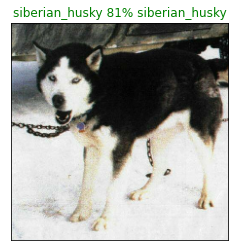

In [55]:
# Creating a function to view the prediction, true label and image.
def plot_pred(prediction_probablity, label, image, n=1):
  
  pred_prob, true_label, true_image = prediction_probablity[n], label[n], image[n]
  pred_label = get_preds_label(pred_prob)

  plt.imshow(true_image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label,
                              np.max(pred_prob)*100,
                              true_label),
                              color=color)
  

plot_pred(prediction_probablity=predictions, 
          label=val_labels, 
          image=val_images,
          n=85)

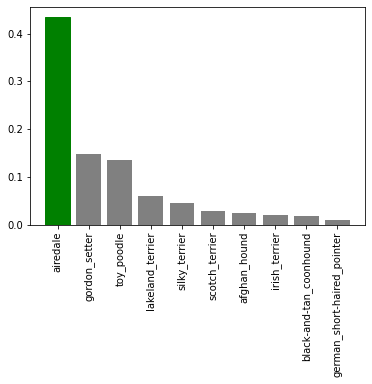

In [56]:
# Plotting top 10 prediction probablity values and labels.
def plot_10(prediction_probablity, labels, n=1):
  
  pred_prob, true_labels = prediction_probablity[n], labels[n]
  pred_label = get_preds_label(pred_prob)

  # Top 10 prediction confidence indexes
  top_10_pred_index = pred_prob.argsort()[-10:][::-1]

  # Top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_index]

  # Top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_index]

  # Setting up plot
  # plt.figure(figsize=(8,8))
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             top_10_pred_labels,
             rotation="vertical")
  
  # change in color
  if np.isin(true_labels, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_labels)].set_color("green")
  else:
    print("false")
    pass

plot_10(prediction_probablity=predictions, labels=val_labels, n=69)

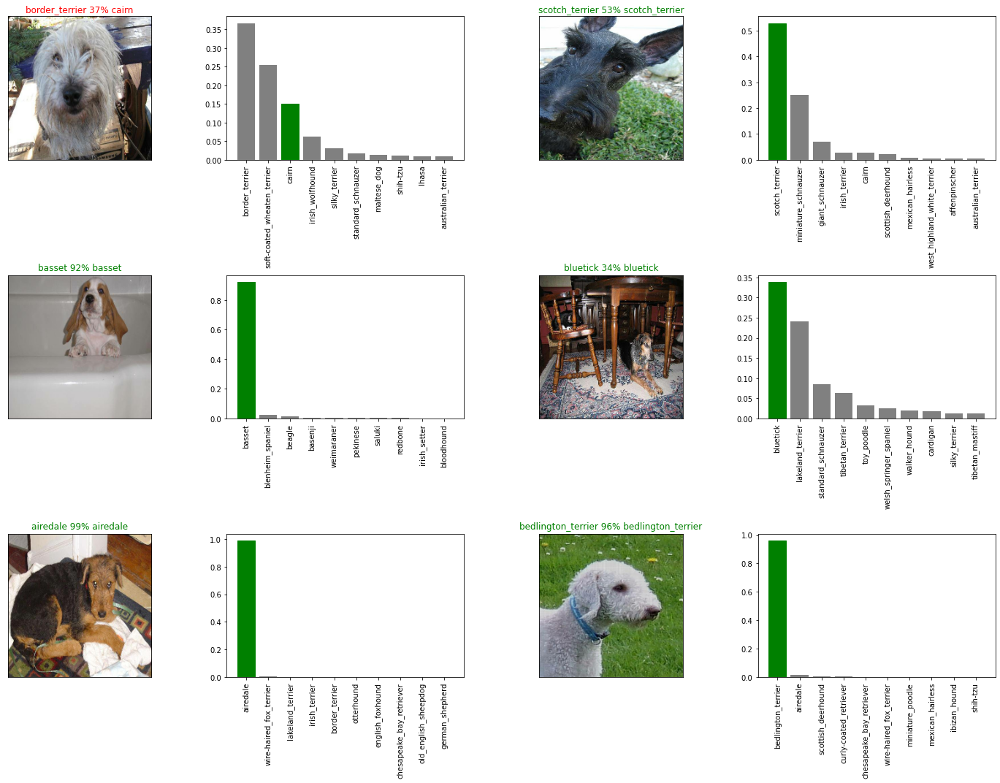

In [57]:
def visuals(i_multiplier=0, num_rows=3, num_cols=2):
  num_images = num_rows*num_cols

  plt.figure(figsize=(10*num_cols, 5*num_rows))

  for i in range(num_images):
    
    # Displaying the prediction, true label and image. 
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(prediction_probablity=predictions, 
              label=val_labels, 
              image=val_images,
              n=i+i_multiplier)
    
    # Displaying top 10 prediction probablity values and labels.
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_10(prediction_probablity=predictions, 
            labels=val_labels, 
            n=i+i_multiplier)
    
  plt.tight_layout(h_pad=1.0)
  plt.show()


visuals()

In [58]:
# Evaluate the model
model.evaluate(val_data)

7/7 [==============================] - 8s 1s/step - loss: 1.2212 - accuracy: 0.6950


[1.2211648225784302, 0.6949999928474426]

## Saving and Reloading the model

In [59]:
# Function to Save a model
def save_model(model, suffix=None):
  modeldir = os.path.join("drive/MyDrive/Dog_Breed/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + '-' + suffix + '.h5'
  print(f"Saving model to: {model_path}......")
  model.save(model_path)
  return model_path

In [60]:
# Function to Load a saved model
def load_model(model_path):
  print(f"Loading model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [61]:
# Saving the model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetV2-Adam")

Saving model to: drive/MyDrive/Dog_Breed/models/20230113-043142-1000-images-mobilenetV2-Adam.h5......


'drive/MyDrive/Dog_Breed/models/20230113-043142-1000-images-mobilenetV2-Adam.h5'

In [62]:
# Loading the model
trained_model_1000 = load_model('drive/MyDrive/Dog_Breed/models/20230112-230934-1000-images-mobilenetV2-Adam.h5')
trained_model_1000

Loading model from: drive/MyDrive/Dog_Breed/models/20230112-230934-1000-images-mobilenetV2-Adam.h5


In [63]:
# Evaluate the loaded model
trained_model_1000.evaluate(val_data)

7/7 [==============================] - 10s 1s/step - loss: 1.1766 - accuracy: 0.6700


[1.1765954494476318, 0.6700000166893005]

## Training a model on the `Full-Data`

In [64]:
len(x), len(y)

(10222, 10222)

In [65]:
x[:10], y[:2]

(['drive/MyDrive/Dog_Breed/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
  'drive/MyDrive/Dog_Breed/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
  'drive/MyDrive/Dog_Breed/train/001cdf01b096e06d78e9e5112d419397.jpg',
  'drive/MyDrive/Dog_Breed/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
  'drive/MyDrive/Dog_Breed/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
  'drive/MyDrive/Dog_Breed/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
  'drive/MyDrive/Dog_Breed/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
  'drive/MyDrive/Dog_Breed/train/002a283a315af96eaea0e28e7163b21b.jpg',
  'drive/MyDrive/Dog_Breed/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
  'drive/MyDrive/Dog_Breed/train/0042188c895a2f14ef64a918ed9c7b64.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,  True, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False

In [66]:
len(x_train), len(y_train)

(800, 800)

In [67]:
# Data batch with full dataset
full_data = create_batch(x, y)

Creating train_data batches........


In [68]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [69]:
full_model = create_model()

Building the model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [70]:
# Creating full model callbacks
full_model_tensorboard = tensorboard_callback()
full_model_EarlyStop = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)
                                                        


In [71]:
# Fit the full model to full data
full_model.fit(x=full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard, full_model_EarlyStop])

Epoch 1/100
320/320 [==============================] - 352s 1s/step - loss: 1.3455 - accuracy: 0.6644
Epoch 2/100
320/320 [==============================] - 357s 1s/step - loss: 0.3989 - accuracy: 0.8786
Epoch 3/100
320/320 [==============================] - 355s 1s/step - loss: 0.2354 - accuracy: 0.9364
Epoch 4/100
320/320 [==============================] - 356s 1s/step - loss: 0.1517 - accuracy: 0.9638
Epoch 5/100
320/320 [==============================] - 363s 1s/step - loss: 0.1057 - accuracy: 0.9779
Epoch 6/100
320/320 [==============================] - 366s 1s/step - loss: 0.0760 - accuracy: 0.9883
Epoch 7/100
320/320 [==============================] - 363s 1s/step - loss: 0.0590 - accuracy: 0.9912
Epoch 8/100
320/320 [==============================] - 368s 1s/step - loss: 0.0460 - accuracy: 0.9940
Epoch 9/100
320/320 [==============================] - 366s 1s/step - loss: 0.0360 - accuracy: 0.9967
Epoch 10/100
320/320 [==============================] - 360s 1s/step - loss: 0.032

In [72]:
# Saving the full model
save_model(full_model, suffix="Teth-Adam")

Saving model to: drive/MyDrive/Dog_Breed/models/20230113-064643-Teth-Adam.h5......


'drive/MyDrive/Dog_Breed/models/20230113-064643-Teth-Adam.h5'

In [73]:
# loading the full model
teth_adam = load_model('drive/MyDrive/Dog_Breed/models/20230113-014119-Teth-Adam.h5')
teth_adam

Loading model from: drive/MyDrive/Dog_Breed/models/20230113-014119-Teth-Adam.h5


## Making prediction on test dataset

In [74]:
# Load test filenames
test_path = 'drive/MyDrive/Dog_Breed/test/'
test_filenames = [test_path + i for i in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog_Breed/test/df69bb4b3dbdc81541e2bd70a5f35cb1.jpg',
 'drive/MyDrive/Dog_Breed/test/dd3ac0ab0e9328f1f4c1692947c17c09.jpg',
 'drive/MyDrive/Dog_Breed/test/e3baf6b2914677edd2729db0f32e2620.jpg',
 'drive/MyDrive/Dog_Breed/test/e004d9f3a6236e2de6dd0f386b685059.jpg',
 'drive/MyDrive/Dog_Breed/test/e3a7aeb038b8abd3f8ed910c84504efc.jpg',
 'drive/MyDrive/Dog_Breed/test/e66eb9532985301394e1bfb8f05206d4.jpg',
 'drive/MyDrive/Dog_Breed/test/dcd3cfe0cd6d363a3ed21639c434c8d3.jpg',
 'drive/MyDrive/Dog_Breed/test/e24b2d063b3ad699d5eba7a01e4ae956.jpg',
 'drive/MyDrive/Dog_Breed/test/e13f3871a8b4a745717ba6903f0dfe05.jpg',
 'drive/MyDrive/Dog_Breed/test/de9fc145601771b7a5b7e68822416fb5.jpg']

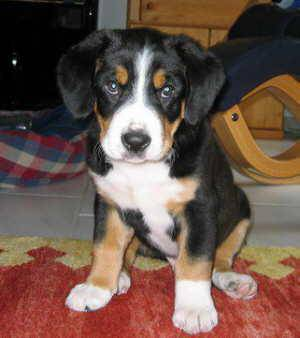

In [75]:
Image(test_filenames[0])

In [76]:
len(test_filenames)

10357

In [77]:
# Creating test batch
test_data = create_batch(test_filenames, test_data=True)
test_data

Creating test_data batches.......


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [78]:
len(test_data)

324

In [83]:
# Making prediction on test data batch.
test_predictions = teth_adam.predict(test_data, verbose=1)

324/324 [==============================] - 426s 1s/step


In [84]:
len(test_predictions)

10357

In [85]:
# Saving predictions to csv file
np.savetxt("drive/MyDrive/Dog_Breed/preds_array.csv", test_predictions, delimiter=",")

In [86]:
# Load predictions from csv file
test_preds = np.loadtxt("drive/MyDrive/Dog_Breed/preds_array.csv", delimiter=",")

In [87]:
test_preds.shape

(10357, 120)

In [88]:
test_preds[:10]

array([[5.23109445e-10, 7.05876200e-12, 7.24599547e-10, ...,
        1.60325841e-09, 9.63454316e-11, 2.67616103e-11],
       [1.64067817e-08, 2.54701772e-12, 5.89026328e-11, ...,
        1.74635206e-09, 9.46404621e-11, 8.73915873e-09],
       [7.77630760e-07, 2.75136972e-06, 5.06551823e-09, ...,
        1.44315582e-08, 4.33006409e-10, 1.85481597e-09],
       ...,
       [2.14491365e-07, 2.21297742e-05, 6.84152269e-07, ...,
        3.96985815e-05, 1.31358305e-04, 7.22319768e-08],
       [1.56581492e-09, 4.87439775e-06, 1.93291214e-08, ...,
        3.67498942e-05, 4.05480137e-07, 1.23111851e-11],
       [1.15802788e-12, 3.56294350e-09, 1.16900576e-13, ...,
        4.03126705e-08, 1.91200855e-09, 3.40559775e-10]])

## Preparing test dataset predictions in submission format for Kaggle.

Kaggle's submission format: https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation





In [91]:
preds_df = pd.DataFrame(columns=["Id"] + list(unique_breeds))
preds_df.head()

,Id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [93]:
test_filenames[:10]

['drive/MyDrive/Dog_Breed/test/df69bb4b3dbdc81541e2bd70a5f35cb1.jpg',
 'drive/MyDrive/Dog_Breed/test/dd3ac0ab0e9328f1f4c1692947c17c09.jpg',
 'drive/MyDrive/Dog_Breed/test/e3baf6b2914677edd2729db0f32e2620.jpg',
 'drive/MyDrive/Dog_Breed/test/e004d9f3a6236e2de6dd0f386b685059.jpg',
 'drive/MyDrive/Dog_Breed/test/e3a7aeb038b8abd3f8ed910c84504efc.jpg',
 'drive/MyDrive/Dog_Breed/test/e66eb9532985301394e1bfb8f05206d4.jpg',
 'drive/MyDrive/Dog_Breed/test/dcd3cfe0cd6d363a3ed21639c434c8d3.jpg',
 'drive/MyDrive/Dog_Breed/test/e24b2d063b3ad699d5eba7a01e4ae956.jpg',
 'drive/MyDrive/Dog_Breed/test/e13f3871a8b4a745717ba6903f0dfe05.jpg',
 'drive/MyDrive/Dog_Breed/test/de9fc145601771b7a5b7e68822416fb5.jpg']

In [94]:
test_path

'drive/MyDrive/Dog_Breed/test/'

In [96]:
test_ids = [os.path.splitext(i)[0] for i in os.listdir(test_path)]
test_ids[:10]

['df69bb4b3dbdc81541e2bd70a5f35cb1',
 'dd3ac0ab0e9328f1f4c1692947c17c09',
 'e3baf6b2914677edd2729db0f32e2620',
 'e004d9f3a6236e2de6dd0f386b685059',
 'e3a7aeb038b8abd3f8ed910c84504efc',
 'e66eb9532985301394e1bfb8f05206d4',
 'dcd3cfe0cd6d363a3ed21639c434c8d3',
 'e24b2d063b3ad699d5eba7a01e4ae956',
 'e13f3871a8b4a745717ba6903f0dfe05',
 'de9fc145601771b7a5b7e68822416fb5']

In [97]:
preds_df["Id"] = test_ids
preds_df.head()

,Id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,df69bb4b3dbdc81541e2bd70a5f35cb1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dd3ac0ab0e9328f1f4c1692947c17c09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e3baf6b2914677edd2729db0f32e2620,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e004d9f3a6236e2de6dd0f386b685059,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e3a7aeb038b8abd3f8ed910c84504efc,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [98]:
preds_df[list(unique_breeds)] = test_preds
preds_df.head()

,Id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,df69bb4b3dbdc81541e2bd70a5f35cb1,5.231094e-10,7.058762e-12,7.245995e-10,1.113807e-09,1.398837e-07,2.296536e-05,2.860206e-09,1.851244e-07,6.581784e-09,...,3.495799e-09,8.074228e-11,6.178413e-10,2.485375e-08,6.367392e-10,1.968764e-09,4.131076e-11,1.603258e-09,9.634543e-11,2.676161e-11
1,dd3ac0ab0e9328f1f4c1692947c17c09,1.640678e-08,2.547018e-12,5.890263e-11,1.644861e-12,6.566869e-10,2.196936e-12,6.923027e-11,1.042476e-09,1.162048e-07,...,7.508048e-09,1.256649e-09,1.033994e-10,2.169683e-10,6.484909e-09,1.308180e-11,7.309462e-09,1.746352e-09,9.464046e-11,8.739159e-09
2,e3baf6b2914677edd2729db0f32e2620,7.776308e-07,2.751370e-06,5.065518e-09,3.034951e-07,2.495347e-07,8.250630e-09,1.182671e-09,1.289104e-09,1.743431e-10,...,2.039310e-04,1.019709e-09,9.572436e-08,2.123013e-07,5.855104e-09,3.148158e-12,2.443658e-10,1.443156e-08,4.330064e-10,1.854816e-09
3,e004d9f3a6236e2de6dd0f386b685059,2.549214e-05,1.269137e-05,6.558561e-09,1.189556e-03,2.927794e-08,2.997481e-05,2.440509e-11,7.069109e-08,5.156758e-04,...,3.476033e-08,5.207115e-09,2.944317e-10,2.589646e-08,8.154831e-05,8.608303e-08,6.189112e-09,1.897075e-03,1.743345e-07,1.045003e-06
4,e3a7aeb038b8abd3f8ed910c84504efc,8.553918e-07,1.981700e-06,5.241339e-08,4.662175e-02,4.053617e-06,7.250421e-07,2.340148e-02,6.343236e-06,6.807902e-08,...,3.031826e-04,1.048418e-06,3.948585e-05,2.057541e-06,3.421663e-07,8.017819e-05,4.118449e-06,7.680688e-07,2.222902e-01,4.982367e-05


In [106]:
# Saving prediction dataframe
preds_df.to_csv("drive/MyDrive/Dog_Breed/Full_Model_Prediction.csv", index=False)

# Making Prediction on `custom_images`

In [160]:
# Setting custom image filepaths
custom_path = "drive/MyDrive/Dog_Breed/Custom_Images/"
custom_filepaths = [custom_path + i for i in os.listdir(custom_path)]
custom_filepaths

['drive/MyDrive/Dog_Breed/Custom_Images/WhatsApp Image 2023-01-13 at 2.26.29 PM .jpeg',
 'drive/MyDrive/Dog_Breed/Custom_Images/WhatsApp Image 2023-01-13 at 2.26.29 PM.jpeg',
 'drive/MyDrive/Dog_Breed/Custom_Images/WhatsApp Image 2023-01-13 at 3.20.52 PM.jpeg']

In [161]:
# Turn custom data into data batches
custom_data = create_batch(custom_filepaths, test_data=True) 

Creating test_data batches.......


In [162]:
custom_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [163]:
# Making prediction on custom data
custom_preds = teth_adam.predict(custom_data)
custom_preds

1/1 [==============================] - 0s 239ms/step


array([[1.73059576e-08, 5.89322990e-05, 6.75054768e-09, 1.75682970e-08,
        4.75221973e-10, 1.32199450e-04, 1.03691821e-06, 2.08832116e-08,
        4.27380726e-08, 3.24900523e-11, 4.83063438e-08, 1.82587769e-07,
        5.54258040e-05, 3.05043304e-05, 8.42688307e-02, 1.59816604e-08,
        2.65445988e-06, 6.69297970e-06, 1.16312435e-06, 6.01419270e-09,
        3.49175744e-10, 1.32552043e-06, 8.41886940e-05, 5.45309194e-05,
        1.34992217e-06, 2.23963002e-06, 7.56174637e-11, 9.53014889e-10,
        3.30083594e-06, 5.66314959e-08, 1.43142679e-05, 8.07493052e-06,
        5.47821583e-05, 3.86943475e-06, 5.21798393e-06, 1.70509253e-07,
        1.34849715e-05, 7.14032808e-07, 1.11867287e-07, 1.76976304e-04,
        5.84991710e-07, 2.63706369e-07, 5.20649394e-07, 2.27398807e-04,
        2.78753054e-04, 1.01805533e-07, 9.48924753e-06, 7.55777485e-09,
        1.49967684e-06, 8.89001369e-01, 2.55417917e-03, 1.21333451e-05,
        1.71497541e-05, 4.15772411e-06, 5.39995106e-08, 5.088131

In [164]:
 custom_preds.shape

(3, 120)

In [165]:
# Get custom image prediction labels
custom_pred_labels = [get_preds_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels 

['golden_retriever', 'great_dane', 'samoyed']

In [166]:
# Getting custom images
custom_images = []

for images in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(images)

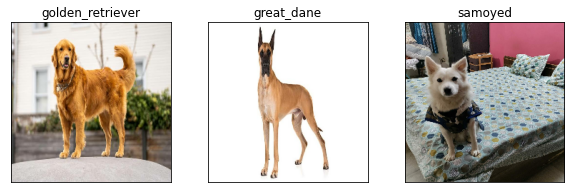

In [167]:
# Visualizing custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(3, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

# Note :
## Samoyed are mistakenly called Pomeranians. In India, a very few people know the difference between Samoyeds and Pomeranians. The Pomeranian are rarely seen in shows. Pomeranian are descended from sledge pulling dogs of Antarctica and related to Samoyed